# Summary

This notebook is to visualize results for different simulations produced via TVB and then to validate the data. Namely, I need to check:
* SEEG signals and make sure they are bandpass filtered / high pass filtered
* Z time series and onset/offset times are correctly stored

Then I can resave data

In [1]:
# %pylab nbagg
from tvb.simulator.lab import *
import os.path
from matplotlib import colors, cm
import time
import scipy.signal as sig

import numpy as np
import pandas as pd
import scipy.io

sys.path.append('../')

# downloaded library for peak detection in z time series
import tvbsim
from tvbsim.postprocess import peakdetect

import re
import sys
sys.path.append('/Users/adam2392/Documents/fragility_analysis/')

%matplotlib inline
%load_ext autoreload
%autoreload 2

2018-04-24 18:50:30,335 - WARNING - tvb.simulator.common - psutil module not available: no warnings will be issued when a
    simulation may require more memory than available
   INFO  log level set to INFO


In [2]:
from scipy.signal import butter, lfilter
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band', analog=False)
    return b, a
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = scipy.signal.filtfilt(b, a, data)
    return y
def butter_highpass(lowcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    b, a = butter(order, low, btype='highpass', analog=False)
    return b, a
def butter_highpass_filter(data, lowcut, fs, order=5):
    b, a = butter_highpass(lowcut, fs, order=order)
    y = scipy.signal.filtfilt(b, a, data)
    return y
def overlap(start1, end1, start2, end2):
    """Does the range (start1, end1) overlap with (start2, end2)?"""
    return (
        start1 <= start2 <= end1 or
        start1 <= end2 <= end1 or
        start2 <= start1 <= end2 or
        start2 <= end1 <= end2
    )

import matplotlib
import matplotlib.pyplot as plt

def getseiztimes(onsettimes, offsettimes):
    minsize = np.min((len(onsettimes),len(offsettimes)))
    
    seizonsets = []
    seizoffsets = []
    idx = 0
    while idx < minsize-1:
        seizonsets.append(onsettimes[idx])
        onsettime = onsettimes[idx]
        offsettime = offsettimes[idx]
        next_onset = onsettimes[idx+1]
        next_offset = offsettimes[idx+1] 

        idx+=1
        # for idx in xrange(len(onsettimes)):
        while overlap(onsettime, offsettime, next_onset,next_offset):
            if idx >= len(onsettimes) or idx >= len(offsettimes):
                break
            next_onset = onsettimes[idx]
            next_offset = offsettimes[idx]
            idx+=1

        seizoffsets.append(offsettimes[idx-1])

    return seizonsets, seizoffsets

def getseiztimes_v2(onsettimes, offsettimes):
    minsize = np.min((len(onsettimes),len(offsettimes)))
    seizonsets = []
    seizoffsets = []
    
    # perform some checks
    if minsize == 0:
        print "no full onset/offset available!"
        return 0
    
    idx = 0
    # to store the ones we are checking rn
    _onset = onsettimes[idx]
    _offset = offsettimes[idx]
    seizonsets.append(_onset)
    
    # start loop after the first onset/offset pair
    for i in range(1,minsize):        
        # to store the previoius values
        _nextonset = onsettimes[i]
        _nextoffset = offsettimes[i]
        
        # check this range and add the offset if it was a full seizure
        # before the next seizure
        if _nextonset < _offset:
            _offset = _nextoffset
        else:
            seizoffsets.append(_offset)
            idx = i
            # to store the ones we are checking rn
            _onset = onsettimes[idx]
            _offset = offsettimes[idx]
            seizonsets.append(_onset)
    if len(seizonsets) != len(seizoffsets):
        seizonsets = seizonsets[0:len(seizoffsets)]
    return seizonsets, seizoffsets
            
def getonsetsoffsets(zts, ezindices, pzindices, delta=0.2/8):
    # create lambda function for checking the indices
    check = lambda indices: isinstance(indices,np.ndarray) and len(indices)>=1
    
    onsettimes=np.array([])
    offsettimes=np.array([])
    if check(ezindices):
        print "checked ezindices"
        for ezindex in ezindices:
            _onsettimes, _offsettimes = postprocessor.findonsetoffset(zts[ezindex, :].squeeze(), 
                                                                    delta=delta)
            onsettimes = np.append(onsettimes, np.asarray(_onsettimes))
            offsettimes = np.append(offsettimes, np.asarray(_offsettimes))

    if check(pzindices):
        print "checked pzindices"
        for pzindex in pzindices:
            _onsettimes, _offsettimes = postprocessor.findonsetoffset(zts[pzindex, :].squeeze(), 
                                                                    delta=delta)
            onsettimes = np.append(onsettimes, np.asarray(_onsettimes))
            offsettimes = np.append(offsettimes, np.asarray(_offsettimes))

    # first sort onsettimes and offsettimes
    onsettimes.sort()
    offsettimes.sort()
    
    return onsettimes, offsettimes

In [12]:
# patients = ['id001_ac', 'id002_cj', 'id014_rb']
nez = 3
npz = 1
samplerate = 1000.

# TVB Sim directory & results to save directory
# tvbsimdir = os.path.join('/Users/adam2392/Documents/pydata/tvbforwardsim/',
#                          'nez'+str(nez)+'_npz'+str(npz))
tvbsimdir = os.path.join('/Users/adam2392/Documents/pydata/tvbforwardsim/exp012')

alldatafiles = []
for root, dirs, files in os.walk(tvbsimdir):
    for file in files:
        if file.endswith(".npz"):
            alldatafiles.append(os.path.join(root, file))
            
### Set the font dictionaries (for plot title and axis titles)
title_font = {'fontname':'Arial', 'size':'30', 'color':'black', 'weight':'normal',
          'verticalalignment':'bottom'} # Bottom vertical alignment for more space
axis_font = {'family':'Arial', 'size':'30'}

color_new = ['peru', 'dodgerblue', 'slategrey', 
             'skyblue', 'springgreen', 'fuchsia', 'limegreen', 
             'orangered',  'gold', 'crimson', 'teal', 'blueviolet', 'black', 'cyan', 'lightseagreen',
             'lightpink', 'red', 'indigo', 'mediumorchid', 'mediumspringgreen']

print(len(alldatafiles))

13


id012_pc
id012_pc_dist-1.npz
File that is analyzed:  /Users/adam2392/Documents/pydata/tvbforwardsim/exp012/id012_pc_dist-1.npz
['metadata', 'zts', 'seegts', 'epits', 'times']
['gainmat', 'x0norm', 'x0pz', 'pzregs', 'epiparams', 'seeg_xyz', 'x0ez', 'regions_centers', 'regions', 'offsettimes', 'ezregs', 'onsettimes', 'pzindices', 'patient', 'ezindices', 'chanlabels']
[46 54 53 80]
[ 5 55 56 58 63 72 78]
[ 6690.  9424. 10136. 12580. 15945. 21917. 23151. 25794. 28676. 29344.
 29495. 32704. 33063. 36869. 55841. 57818. 58209. 58353.    nan    nan]
[13523. 14521. 14985. 18038. 23642. 28017.  6575.  2555. 37421. 39296.
  5672. 14075. 38828. 41041. 34489. 32739.    nan    nan 39382. 40859.]
returning cuz prevoffset is nan!
WARNING  File 'hemispheres' not found in ZIP.
id004_cv
id004_cv_dist-1.npz
File that is analyzed:  /Users/adam2392/Documents/pydata/tvbforwardsim/exp012/id004_cv_dist-1.npz
['metadata', 'zts', 'seegts', 'epits', 'times']
['gainmat', 'x0norm', 'x0pz', 'pzregs', 'epiparams', 's

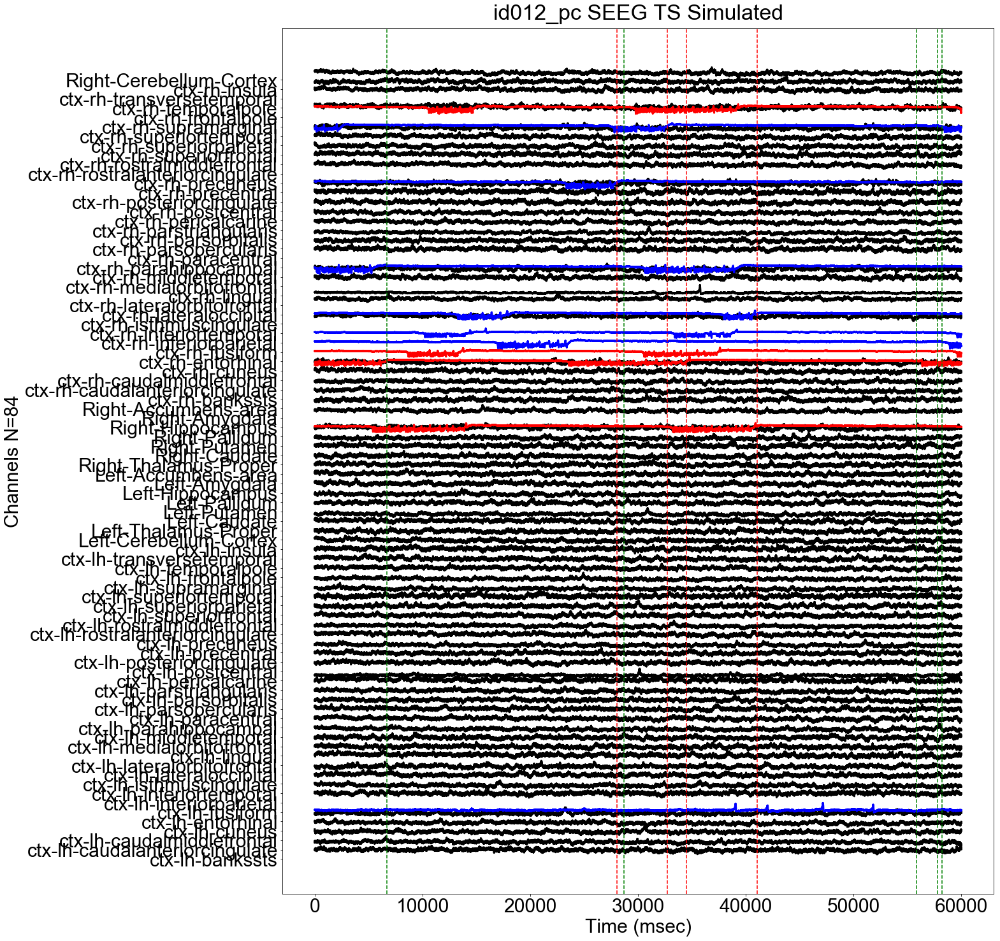

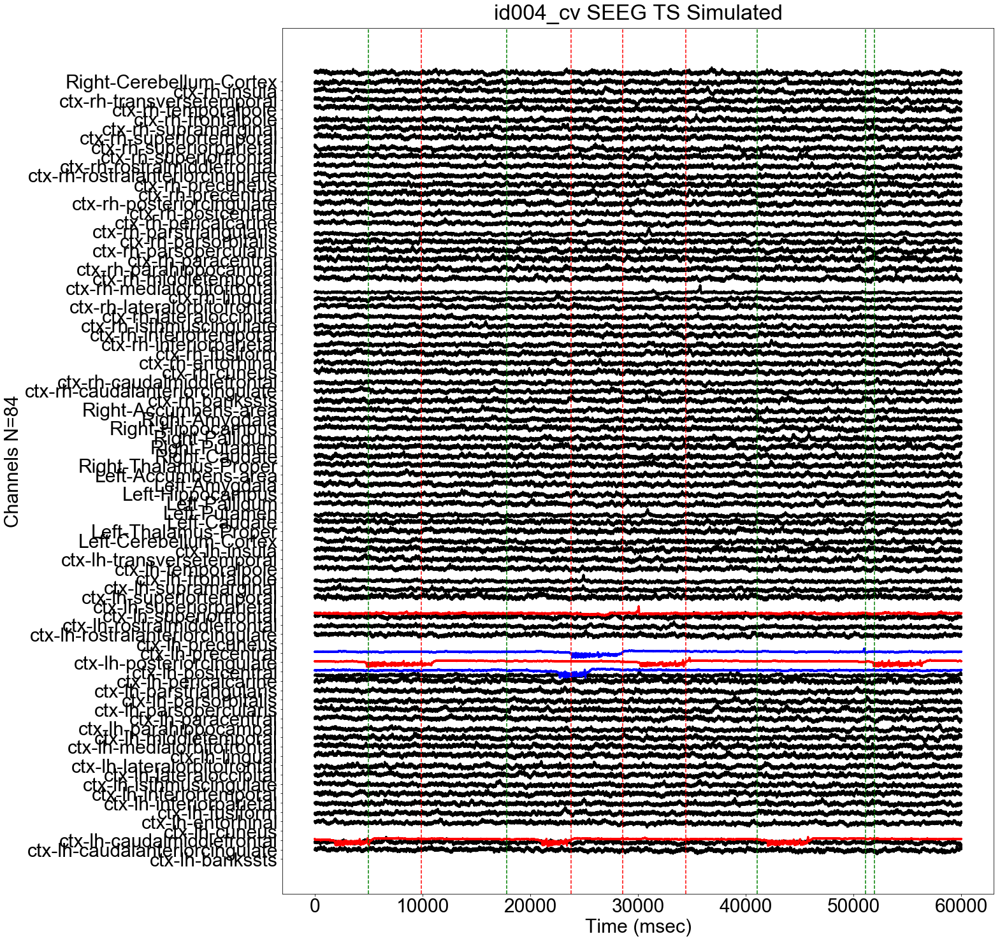

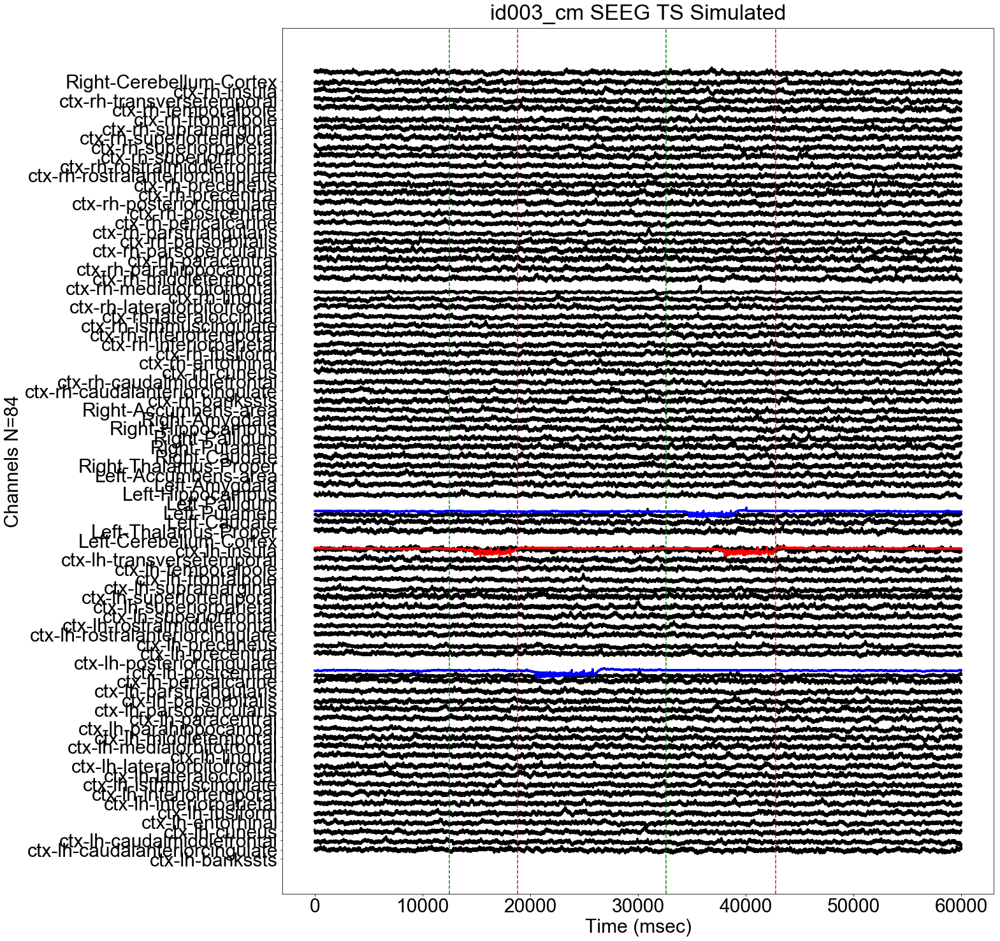

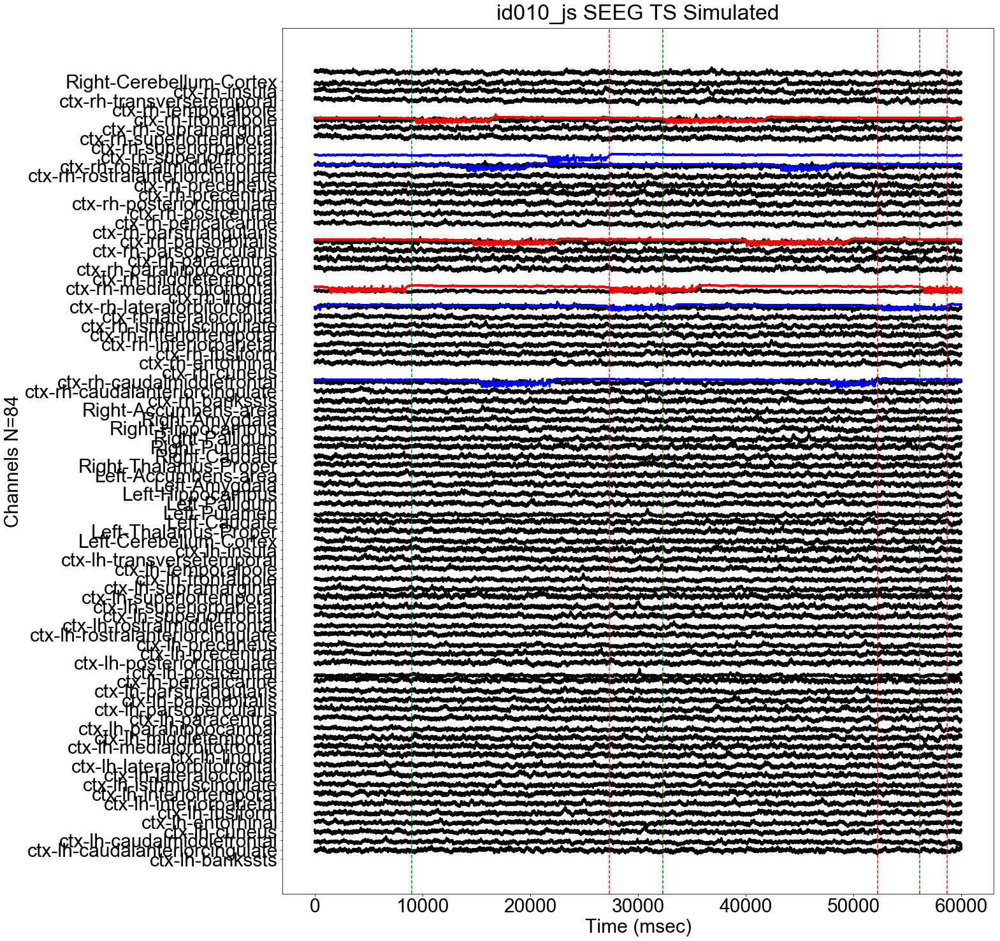

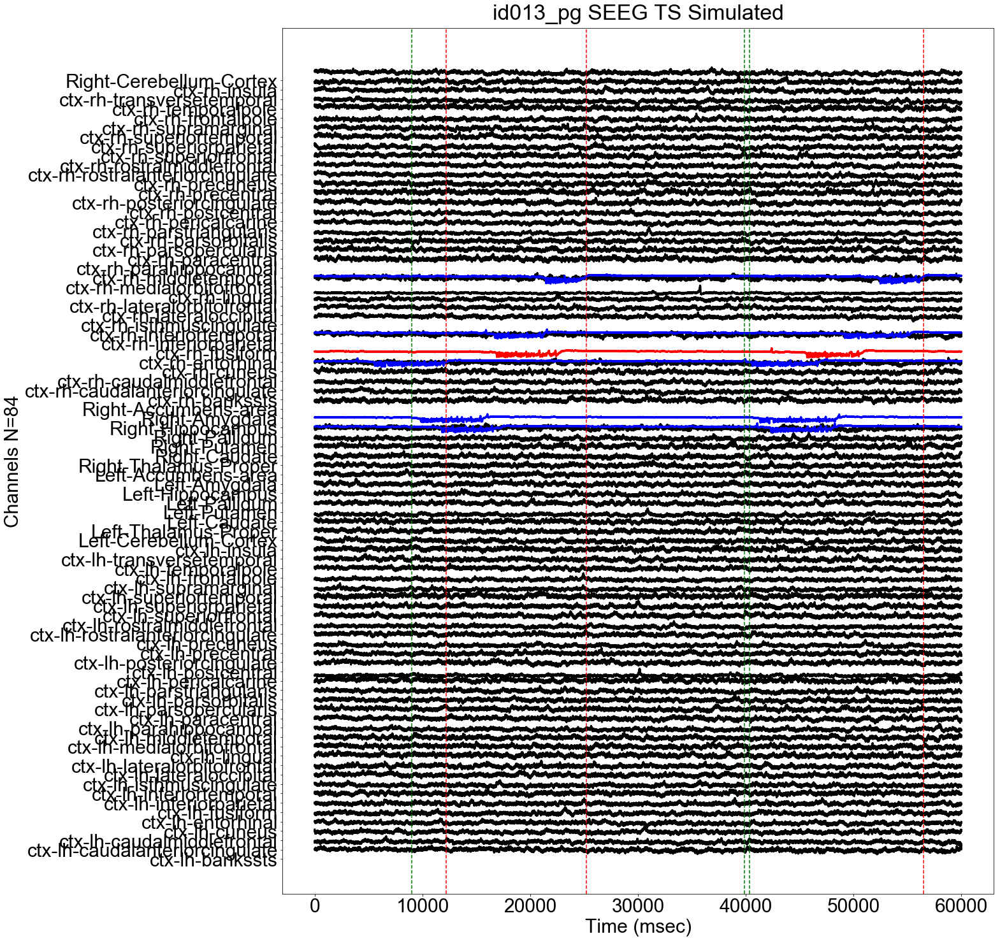

...

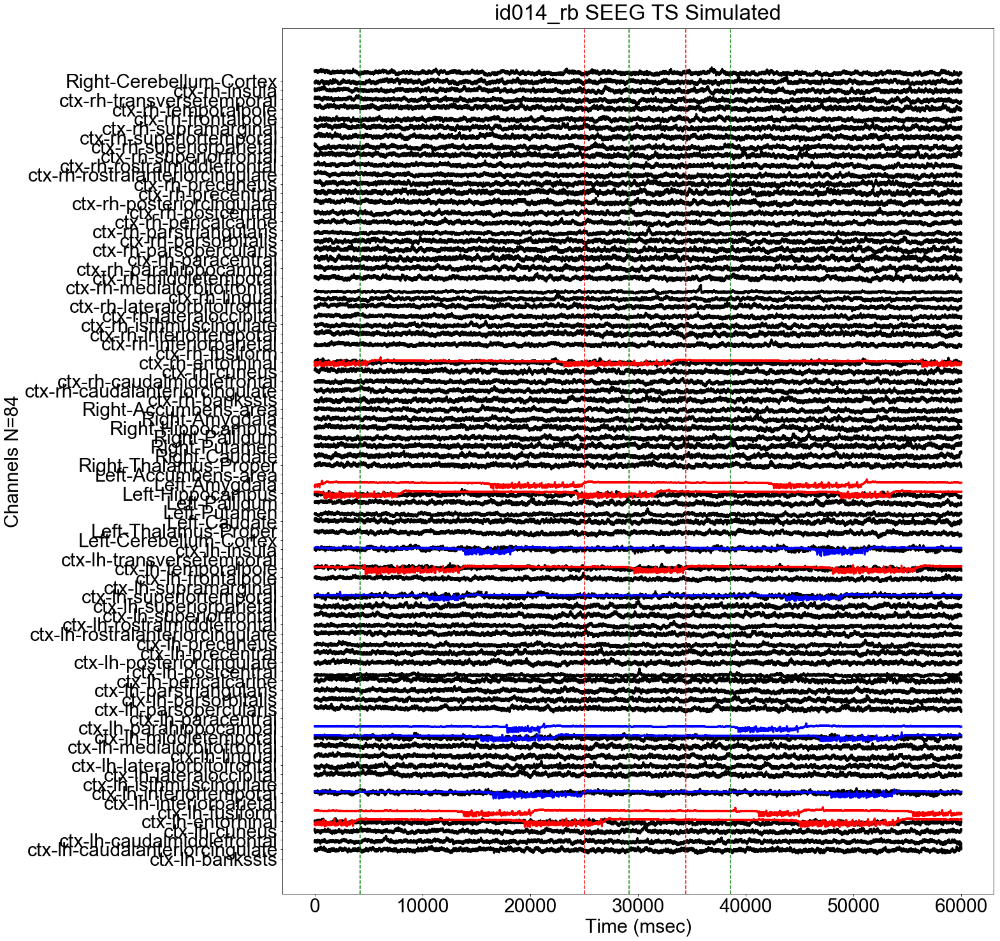

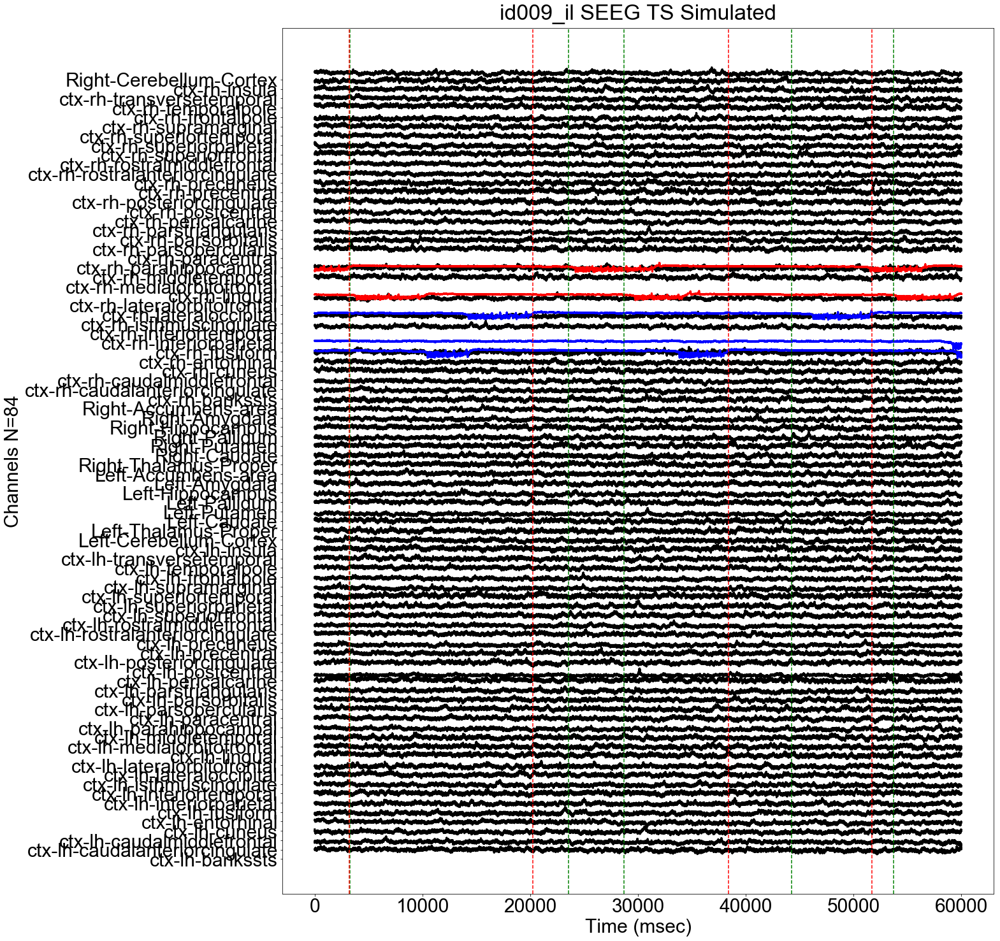

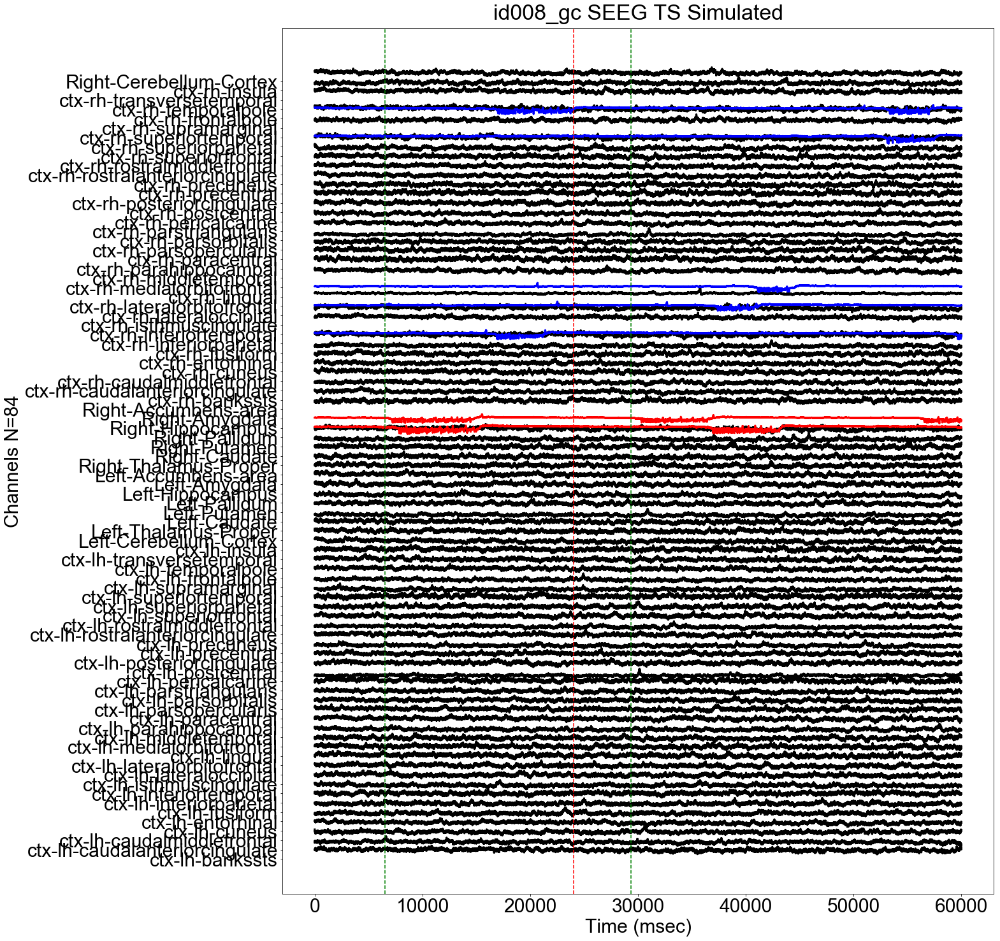

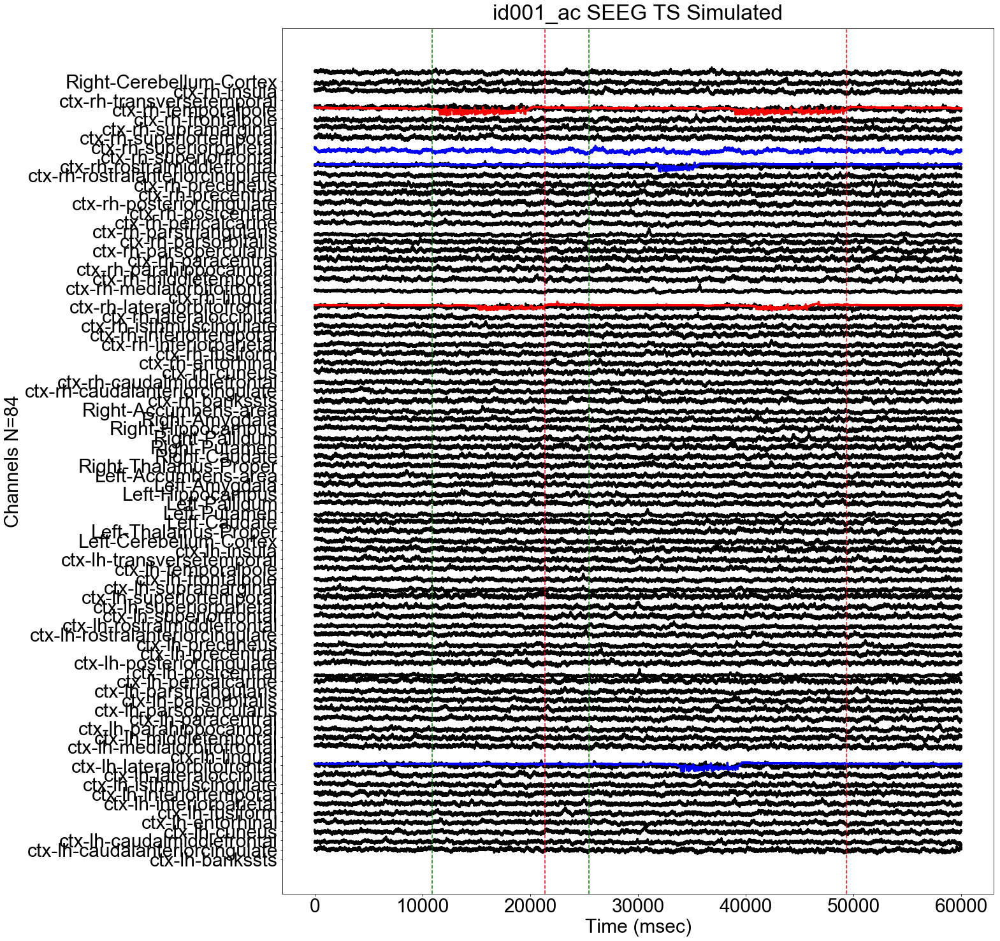

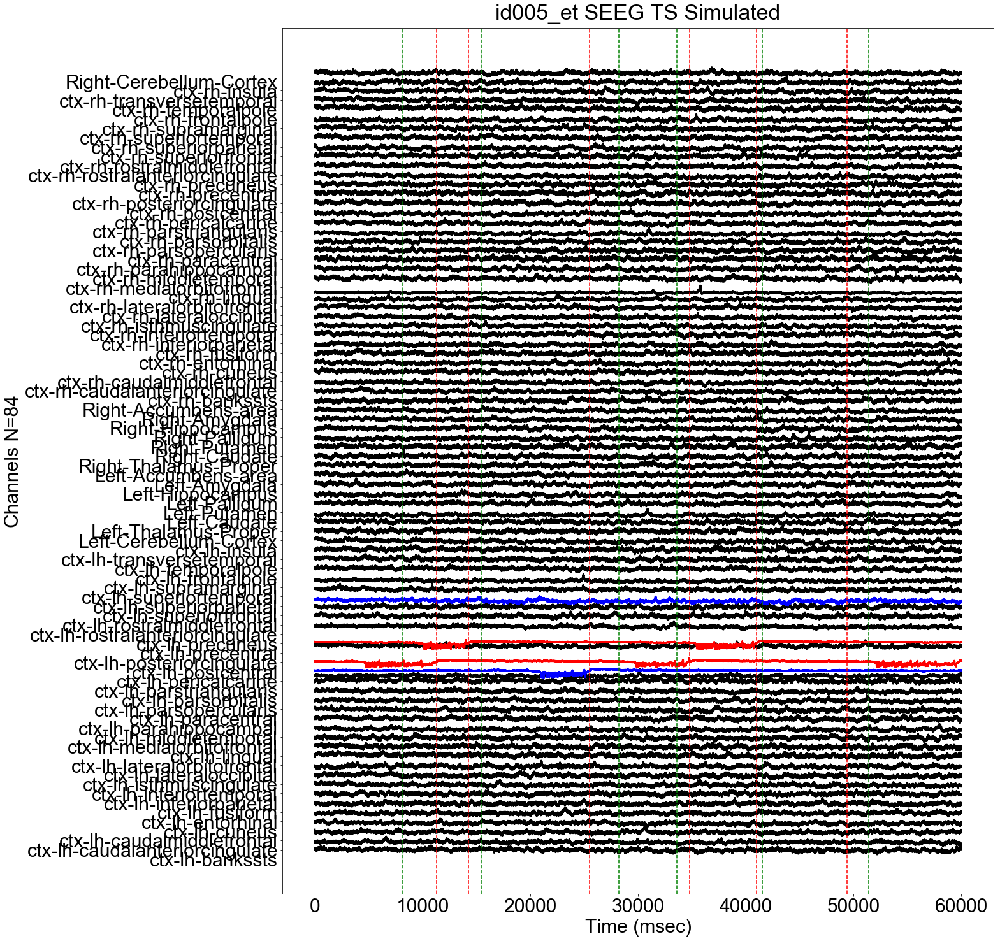

In [32]:
for idx,patfile in enumerate(alldatafiles):
    filename = patfile.split('/')[-1]
    patient = '_'.join( filename.split('_')[0:2])
    print(patient)
    print(filename)
    
    # load in data
    simdata = np.load(patfile)
    metadata = simdata['metadata'].item()
    seegts = simdata['seegts']
    times = simdata['times']
    zts = simdata['zts']
    epits = simdata['epits']
    print "File that is analyzed: ", patfile
    print simdata.keys()
    print metadata.keys()
    _samplerate = 1000
    ezindices = metadata['ezindices']
    pzindices = metadata['pzindices']
    allindices = np.hstack((ezindices,pzindices))
    # instantiate the postprocessor
    postprocessor = tvbsim.postprocess.PostProcessor(samplerate=_samplerate, allszindices=allindices)

    print ezindices
    print pzindices

    # get the onsettimes and offsettimes for ez/pz indices
    settimes = postprocessor.getonsetsoffsets(zts, allindices, lookahead=100, delta=0.2)# get the actual seizure times and offsets
    seizonsets, seizoffsets = postprocessor.getseiztimes(settimes)

    metadatadir = os.path.join('/Users/adam2392/Documents/pydata/metadata/', patient)
    # load in the region labels
    conn = connectivity.Connectivity.from_file(os.path.join(metadatadir, "connectivity.zip"))
    region_labels = conn.region_labels
    
    tsviz = tvbsim.visualize.plotts.VisualTs()
    tsviz.loaddata(data=epits,ylabels=region_labels)
    # visualize seegts
    tsviz.setfigsize(figsize=(20,25))
    fig, ax = tsviz.plotts(normalize=True, titlestr='{} SEEG TS Simulated'.format(patient))
    # tsviz.plotvertlines(onsettimes=settimes[:,0], offsettimes=settimes[:,1])
    tsviz.plotvertlines(onsettimes=seizonsets, offsettimes=seizoffsets)
    tsviz.colorts(ezindices, color='red')
    tsviz.colorts(pzindices, color='blue')
#     fig = plt.figure()
#     for idx in xrange(len(seizonsets)):
#         plt.axvline(seizonsets[idx], color='black')
#         plt.axvline(seizoffsets[idx])

#     cutoff = None
#     if len(onsettimes) > len(offsettimes):
#         nextindex = np.where(onsettimes > seizoffsets[-1])[0][0]
#         # create a cutoff for the entire simulated data
#         cutoff = np.mean([onsettimes[nextindex], seizoffsets[-1]])
        
#         print onsettimes[minsize], seizoffsets[-1]
        
#         # floor to the nearest sample rate
#         cutoff = int(math.floor(cutoff / float(samplerate)) * float(samplerate))
        
#         plt.axvline(cutoff, color='red')
#         epits = epits[:,0:cutoff]
#         seegts = seegts[:, 0:cutoff]
#         zts = zts[:, 0:cutoff]
#         times = times[0:cutoff]
#         print epits.shape
#     plt.show()

    # Save files
    metadata['onsettimes'] = seizonsets
    metadata['offsettimes'] = seizoffsets
    # save tseries
#     np.savez_compressed(patfile, epits=epits, seegts=seegts, \
#              times=times, zts=zts, metadata=metadata)

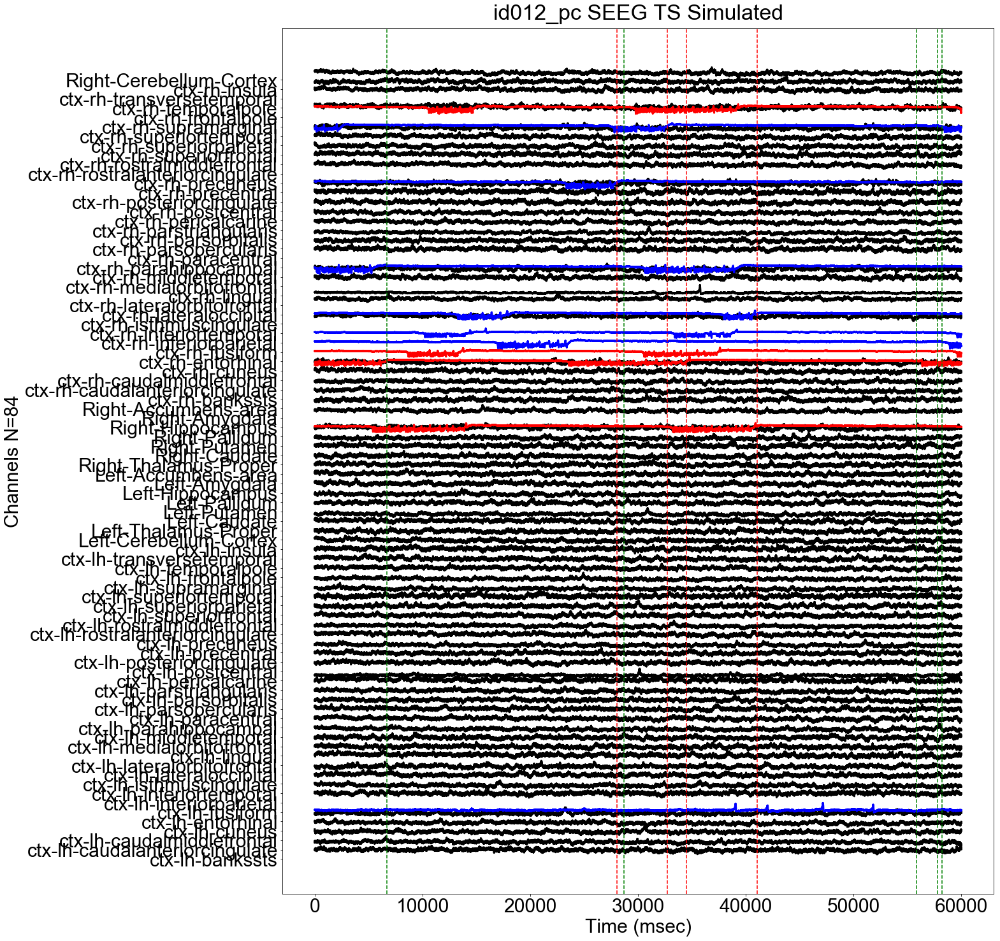

In [31]:
tsviz = tvbsim.visualize.plotts.VisualTs()
tsviz.loaddata(data=epits,ylabels=region_labels)
# visualize seegts
tsviz.setfigsize(figsize=(20,25))
fig, ax = tsviz.plotts(normalize=True, titlestr='{} SEEG TS Simulated'.format(patient))
# tsviz.plotvertlines(onsettimes=settimes[:,0], offsettimes=settimes[:,1])
tsviz.plotvertlines(onsettimes=seizonsets, offsettimes=seizoffsets)
tsviz.colorts(ezindices, color='red')
tsviz.colorts(pzindices, color='blue')

In [5]:
data = np.load('/Volumes/ADAM LI/pydata/tvbforwardsim/varydistance/nez1_npz1_dist3/id014_rb_sim_nez1_npz1.npz')
metadata = data['metadata'].item()
zts = data['zts']
seegts = data['seegts']
epits = data['epits']
times = data['times']


print(data.keys())

['metadata', 'zts', 'seegts', 'epits', 'times']


In [6]:
np.savez_compressed('/Volumes/ADAM LI/pydata/tvbforwardsim/varydistance/nez1_npz1_dist3/id014_rb_sim_nez1_npz1.npz',
                   metadata=metadata, zts=zts, seegts=seegts, epits=epits, times=times)